In [1]:
!python3 train.py --dataset_df_dir data/ --splits_filename dataset_train.csv dataset_val.csv dataset_test.csv --text_col full_text_proc --y_col censored --class_weight automatic --seed 42 --model_save_dir models/ --log_dir log/ --iter_time_span 1000 --csv_output_path output/roberta-base-proc-new.csv --pretrained_model roberta-base --n_epochs 2 --output_type binary --lr 1e-5

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.dense.weight', 'roberta.pooler.dense.weight', 'lm_head.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classi

In [1]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import torch
import transformers
import shap
import pickle
np.random.seed(seed=0)

In [2]:
def select_df(df, lang='en', withheld='DE', exclude_fully_blocked_users=False, only_include_fully_blocked_users=False, exclude_certain_retweet_targets=None):
    if withheld is not None:
        new_df = df[df['withheld'].fillna('').str.contains(f"'{withheld}'")]
    else:
        new_df = df
    new_df = new_df.loc[new_df['lang'] == lang]

    if exclude_fully_blocked_users:
        import pandas as pd
        user_df = pd.read_csv('/home/public/twitter_politics/censorship/data/paper_data/users.csv')
        new_df = new_df[~new_df['author_id'].isin(user_df['id'].values.tolist())]
        return new_df
    
    if only_include_fully_blocked_users:
        # an author_id list
        new_df = new_df[new_df['author_id'].isin(only_include_fully_blocked_users)]

        return new_df
    
    if exclude_certain_retweet_targets:
        for exclude_target in exclude_certain_retweet_targets:
            new_df = new_df[~new_df['text'].str.contains(f"RT @{exclude_target}")]

    return new_df

https://shap-lrjball.readthedocs.io/en/latest/example_notebooks/general/Explainable%20AI%20with%20Shapley%20Values.html#Explaining-a-transformers-NLP-model

1. time matters
2. usernames generate spurious correlation
3. retweets are likely to be censored
4. 

In [2]:
data = pd.read_csv('/nfs/turbo/coe-vvh/ljr/Censorship/data/dataset_test_p_en.csv', engine='python')

In [4]:
tmp_df = data.sample(n=20, replace=False)
print(tmp_df['censored'].values, tmp_df['full_text_proc'].values)

[1 0 0 0 0 1 0 0 0 1 1 1 0 1 0 0 1 0 0 1] ['Description: Fan of #Yankees, #Knicks, and #Giants. Always looking forward to next season... Time of the tweet: Jul 2018. Tweet: Retweet : "Mood: All around the League 🤦\u200d♂️ '
 'Description: The one-stop news site for Israel, the region & the Jewish world Time of the tweet: Mar 2012. Tweet: Entire US intel community sure Israel has decided to attack Iran... reportedly... '
 'Description: The original online source for news, politics and entertainment | Find us on Instagram & TikTok: salonofficial | Subscribe to our newsletters linked in bio. Time of the tweet: May 2020. Tweet: Jared Kushner smacked down by Michigan Gov. Whitmer for blatant lies about coronavirus support '
 'Description: Tweets from 5280 ft. 🏔 #MileHighBasketball Time of the tweet: May 2012. Tweet: Last night  became just 4th Nugget since 1986 to post 21+ pts &amp; 14+ rebs in a playoff game (Camby, LaPhonso &amp; Fat)'
 "Description: WHERE WE STARTED · Out Now Time of the

In [7]:
import transformers
import torch
import numpy as np
import scipy as sp

# load a BERT sentiment analysis model
tokenizer = transformers.AutoTokenizer.from_pretrained("roberta-base")
model = transformers.AutoModelForSequenceClassification.from_pretrained("roberta-base").cuda()

model.load_state_dict(torch.load('/nfs/turbo/coe-vvh/ljr/Censorship/models/20230218-03:07:30_binary_0.1_8_1e-05_adamw.pt'))


# define a prediction function
def f(x):
    tv = torch.tensor([tokenizer.encode(v, pad_to_max_length=True, max_length=500) for v in x]).cuda()
    outputs = model(tv)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:,1]) # use one vs rest logit units
    return val

# build an explainer using a token masker
explainer = shap.Explainer(f, tokenizer)

# explain the model's predictions on IMDB reviews
shap_values = explainer(tmp_df['full_text_proc'].values.tolist())

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.dense.bias', 'lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.decoder.weight', 'roberta.pooler.dense.bias', 'roberta.pooler.dense.weight', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.weight', 'classifie

In [8]:
# plot the first sentence's explanation
shap.plots.text(shap_values)

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


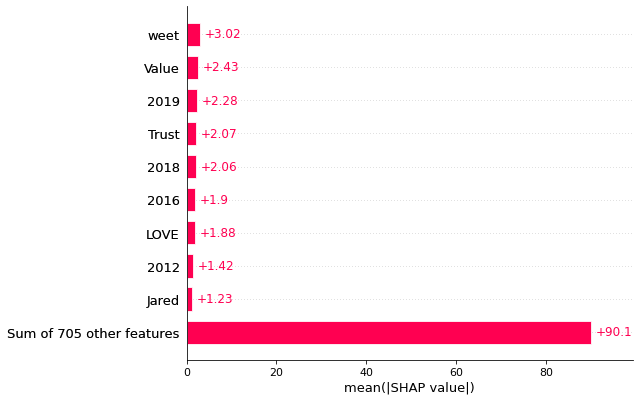

In [9]:
shap.plots.bar(shap_values.abs.mean(0))

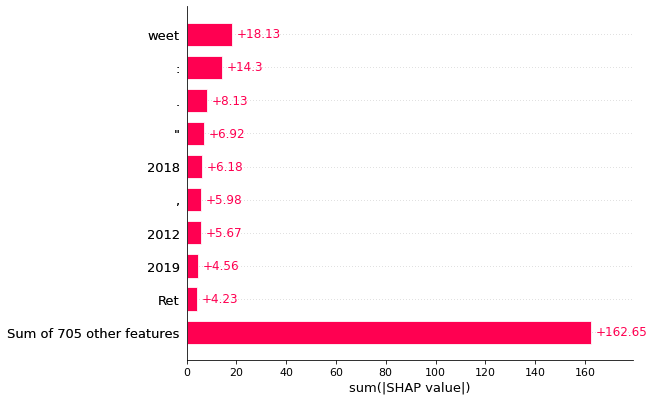

In [10]:
shap.plots.bar(shap_values.abs.sum(0))

In [11]:
tmp_df = data.sample(n=500, replace=False, random_state=0)
# print(tmp_df['censored'].values, tmp_df['full_text_proc'].values)
shap_values = explainer(tmp_df['full_text_proc'].values.tolist())

Partition explainer: 501it [38:06,  4.59s/it]                         


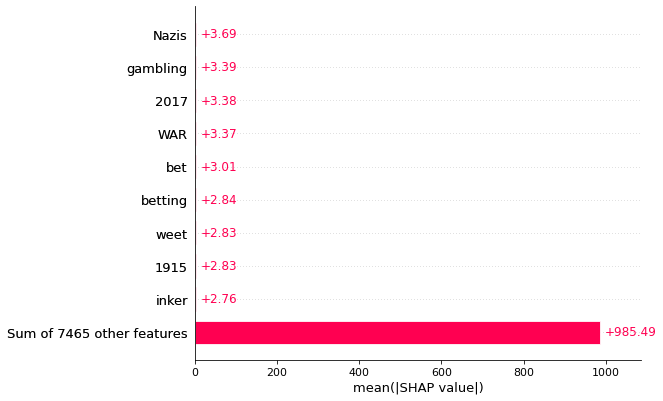

In [12]:
shap.plots.bar(shap_values.abs.mean(0))

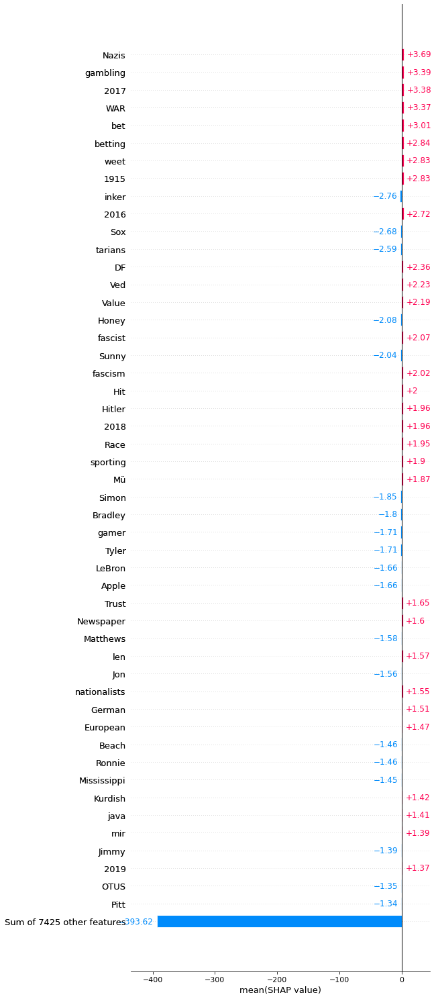

In [18]:
shap.plots.bar(shap_values.mean(0), max_display=50)

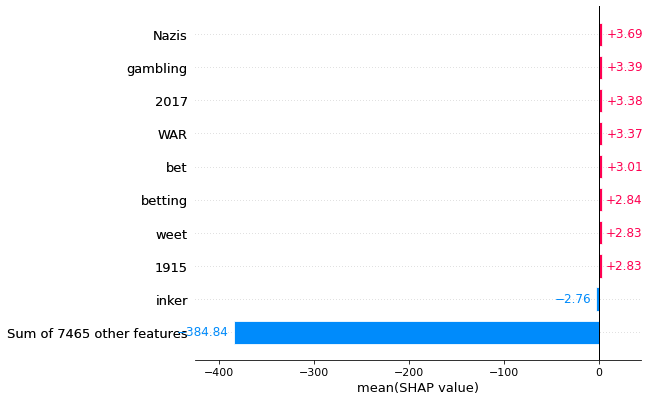

In [14]:
shap.plots.bar(shap_values.mean(0))

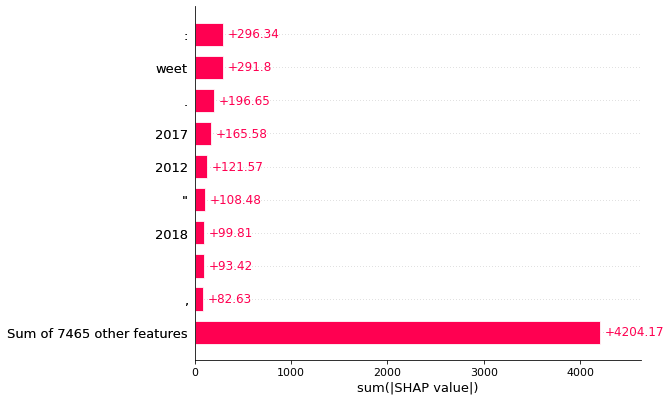

In [13]:
shap.plots.bar(shap_values.abs.sum(0))

# Shapley

In [3]:
# # load the model and tokenizer
# tokenizer = transformers.AutoTokenizer.from_pretrained("roberta-base")
# model = transformers.AutoModelForSequenceClassification.from_pretrained("roberta-base")

# # build a pipeline object to do predictions
# pred = transformers.pipeline("text-classification", model=model, tokenizer=tokenizer, return_all_scores=True)

# model.load_state_dict(torch.load('/nfs/turbo/coe-vvh/ljr/Censorship/models/20230218-03:07:30_binary_0.1_8_1e-05_adamw.pt'))

# explainer = shap.Explainer(pred)

data = pd.read_csv('/nfs/turbo/coe-vvh/ljr/Censorship/data/dataset_test.csv', engine='python')

In [4]:
curr_data = select_df(data, lang='en', withheld=None)

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  10%|█         | 1/10 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  30%|███       | 3/10 [00:56<01:21, 11.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  40%|████      | 4/10 [01:23<01:49, 18.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  50%|█████     | 5/10 [01:45<01:38, 19.69s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  60%|██████    | 6/10 [02:09<01:24, 21.02s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  70%|███████   | 7/10 [02:47<01:19, 26.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  80%|████████  | 8/10 [03:10<00:50, 25.41s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  90%|█████████ | 9/10 [03:33<00:24, 24.91s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 100%|██████████| 10/10 [03:57<00:00, 24.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 11it [04:19, 25.92s/it]                        
Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


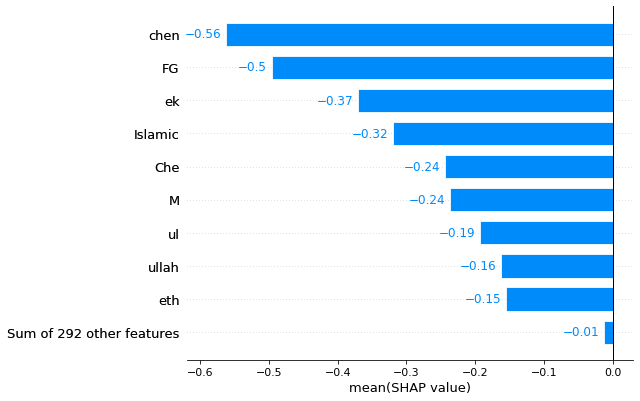

In [3]:
shap_values = explainer(data['text'].values[:10].tolist())

shap.plots.bar(shap_values[:,:,0].mean(0), order=shap.Explanation.argsort)

# TransSHAP

In [33]:
from transformers import BertTokenizer, BertForSequenceClassification
import numpy as np
import pandas as pd
from nltk.tokenize import TweetTokenizer
import random
import logging
np.random.seed(0)
logging.basicConfig(format='%(asctime)s - %(message)s', datefmt='%d-%b-%y %H:%M:%S')
logging.getLogger().setLevel(logging.INFO)

class SCForShap(transformers.AutoModelForSequenceClassification):
    def __init__(self, config):
        super().__init__(config)
    def forward(self, input_ids=None, attention_mask=None, token_type_ids=None, position_ids=None, head_mask=None, inputs_embeds=None, labels=None,):
        output = super().forward(input_ids, attention_mask, token_type_ids, position_ids, head_mask, inputs_embeds, labels)
        return output[0]

# Load pre-trained model tokenizer
pretrained_model = "roberta-base"
tokenizer = transformers.AutoTokenizer.from_pretrained("roberta-base")
model = SCForShap.from_pretrained("roberta-base")

model.load_state_dict(torch.load('/nfs/turbo/coe-vvh/ljr/Censorship/models/20230218-03:07:30_binary_0.1_8_1e-05_adamw.pt'))

# Test texts
tmp_data = np.random.choice(curr_data['full_text_proc'].values, 10)
np.random.choice(curr_data['censored'].values, 10)

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.weight', 'lm_head.dense.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'roberta.pooler.dense.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classi

array([0, 1, 0, 1, 1, 0, 0, 0, 0, 1])

In [25]:
tmp_data

array(["User ID: @Variety. Description: The business of entertainment. Time of the tweet: Jan 2020. Tweet: Is captioning this 'f--k off' appropriate? #Succession's Brian Cox arrives to the #GoldenGlobes ",
       'User ID: @JuliaHB1. Description: Presenter @talkTV Breakfast Show 6.30am-10am Mon-Thurs. DAB+, app or https://t.co/ziGPcSzIm1. Journalist, broadcaster, speaker, event host & woman without a penis Time of the tweet: Mar 2020. Tweet: Quoted: It is immoral and wrong for Prince Charles to have used a coronavirus test when he has only mild symptoms &amp; they are scarce. No one else would be eligible for such a test with mild symptoms. That test could have been better used by a frontline NHS worker or supermarket worker.  "Prince of Wales, 71, tests positive for coronavirus and has mild symptoms "but otherwise remains in good health" ',
       'User ID: @___Colb___. Description: Social Media Producer at @SBNation and @vox_union member. #Elite Time of the tweet: Jan 2020. Tweet: La

## TransSHAP -- LIME

In [14]:
!pip install lime

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement explainers (from versions: none)
ERROR: No matching distribution found for explainers


In [34]:
tmp_data = curr_data['full_text_proc'].values[:5]
curr_data['censored'].values[:5]

array([0, 1, 1, 0, 1])

In [35]:
from lime.lime_text import LimeTextExplainer
from TransSHAP.explainers.LIME_for_text import LIMExplainer

predictor = LIMExplainer(model, tokenizer)
label_names = ["Uncensored", "Censored"]
explainer = LimeTextExplainer(class_names=label_names, split_expression=predictor.split_string)

to_use = tmp_data
for i, example in enumerate(to_use):
    logging.info(f"Example {i+1}/{len(to_use)} start")
    temp = predictor.split_string(example)
    exp = explainer.explain_instance(text_instance=example, classifier_fn=predictor.predict, num_features=len(temp))
    logging.info(f"Example {i + 1}/{len(to_use)} done")
    words = exp.as_list()
    #sum_ = 0.6
    #exp.local_exp = {x: [(xx, yy / (sum(hh for _, hh in exp.local_exp[x])/sum_)) for xx, yy in exp.local_exp[x]] for x in exp.local_exp}
    exp.show_in_notebook(text=True, labels=(exp.available_labels()[0],))

18-Feb-23 14:17:07 - Example 1/5 start
18-Feb-23 14:23:09 - Example 1/5 done


18-Feb-23 14:23:09 - Example 2/5 start
18-Feb-23 14:28:59 - Example 2/5 done


18-Feb-23 14:28:59 - Example 3/5 start
18-Feb-23 14:35:53 - Example 3/5 done


18-Feb-23 14:35:53 - Example 4/5 start
18-Feb-23 14:39:03 - Example 4/5 done


18-Feb-23 14:39:03 - Example 5/5 start
18-Feb-23 14:43:02 - Example 5/5 done


In [30]:
to_use = tmp_data[3:6]
for i, example in enumerate(to_use):
    logging.info(f"Example {i+1}/{len(to_use)} start")
    temp = predictor.split_string(example)
    exp = explainer.explain_instance(text_instance=example, classifier_fn=predictor.predict, num_features=len(temp))
    logging.info(f"Example {i + 1}/{len(to_use)} done")
    words = exp.as_list()
    #sum_ = 0.6
    #exp.local_exp = {x: [(xx, yy / (sum(hh for _, hh in exp.local_exp[x])/sum_)) for xx, yy in exp.local_exp[x]] for x in exp.local_exp}
    exp.show_in_notebook(text=True, labels=(exp.available_labels()[0],))

18-Feb-23 13:32:19 - Example 1/3 start
18-Feb-23 13:37:57 - Example 1/3 done


18-Feb-23 13:37:57 - Example 2/3 start
18-Feb-23 13:41:52 - Example 2/3 done


18-Feb-23 13:41:52 - Example 3/3 start
18-Feb-23 13:45:12 - Example 3/3 done


## TransSHAP -- Shap

In [30]:
# Bag of words (vocabulary)
train_data = curr_data['full_text_proc'].values.tolist()
tknzr = TweetTokenizer()
bag_of_words = set([xx for x in train_data for xx in tknzr.tokenize(x)])

In [36]:
tmp_data = curr_data['full_text_proc'].values[:5]
curr_data['censored'].values[:5]

array([0, 1, 1, 0, 1])

In [ ]:
import shap
from TransSHAP.explainers.SHAP_for_text import SHAPexplainer
logging.getLogger("shap").setLevel(logging.WARNING)
shap.initjs()

words_dict = {0: None}
words_dict_reverse = {None: 0}
for h, hh in enumerate(bag_of_words):
    words_dict[h + 1] = hh
    words_dict_reverse[hh] = h + 1

predictor = SHAPexplainer(model, tokenizer, words_dict, words_dict_reverse)
train_dt = np.array([predictor.split_string(x) for x in np.array(train_data)])
idx_train_data, max_seq_len = predictor.dt_to_idx(train_dt)

explainer = shap.KernelExplainer(model=predictor.predict, data=shap.kmeans(idx_train_data, k=50))

texts_ = [predictor.split_string(x) for x in tmp_data]
idx_texts, _ = predictor.dt_to_idx(texts_, max_seq_len=max_seq_len)

to_use = idx_texts[-1:]
shap_values = explainer.shap_values(X=to_use, nsamples=64, l1_reg="aic")

len_ = len(texts_[-1:][0])
d = {i: sum(x > 0 for x in shap_values[i][0, :len_]) for i, x in enumerate(shap_values)}
m = max(d, key=d.get)
print(" ".join(texts_[-1:][0]))
shap.force_plot(explainer.expected_value[m], shap_values[m][0, :len_], texts_[-1:][0])

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


  0%|          | 0/1 [00:00<?, ?it/s]